In [1]:
import os, sys
from pathlib import Path

_here = Path(os.getcwd())
_root = _here if (_here / "sae").is_dir() else _here.parent
if str(_root) not in sys.path:
    sys.path.insert(0, str(_root))

import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torchvision.datasets import ImageFolder
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [4]:
CHECKPOINT   = str(_root / "sae/checkpoints/sae_block10_k64_final.pt")
UNITOK_CKPT  = os.path.expandvars("$WRKDIR/UniTok/unitok_tokenizer.pth")
IMAGENET_VAL = os.path.expandvars("$WRKDIR/imagenet/val")
# DELTAS_DIR   = str(_root / "sae/deltas")
OUTPUT_DIR   = str(_root / "sae/analysis/magicbrush")
DELTAS_DIR = str(_root / "sae/deltas_multi/n_5")
EDIT_TYPE  = "make_night"   

os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Analyzing: '{EDIT_TYPE}'")
print(f"Output  → {OUTPUT_DIR}")

Analyzing: 'make_night'
Output  → /scratch/work/vuh12/UniTok/sae/analysis/magicbrush


In [5]:
from sae.model import TopKSAE
from sae.unitok_loader import build_unitok

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

ckpt   = torch.load(CHECKPOINT, map_location="cpu")
sae    = TopKSAE(ckpt["input_dim"], ckpt["hidden_dim"], ckpt["k"]).eval().to(device)
sae.load_state_dict(ckpt["sae"])
print(f"SAE: k={ckpt['k']}  hidden={ckpt['hidden_dim']}")

unitok = build_unitok(UNITOK_CKPT, device)
print("UniTok loaded.")

Device: cuda


No pretrained configuration specified for vitamin_large model. Using a default. Please add a config to the model pretrained_cfg registry or pass explicitly.


SAE: k=64  hidden=8192


No pretrained configuration specified for vitamin_large model. Using a default. Please add a config to the model pretrained_cfg registry or pass explicitly.


[unitok_loader] Loading checkpoint: /scratch/work/vuh12/UniTok/unitok_tokenizer.pth
[unitok_loader] Missing: 0, Unexpected: 0
UniTok loaded.


In [6]:
# helpers
def make_transform(img_size=256):
    return transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x * 2 - 1),
    ])

def denorm(x):
    return ((x + 1) / 2).clamp(0, 1)

def to_np(t):
    return (t.cpu().clamp(0, 1).permute(1, 2, 0).numpy() * 255).astype(np.uint8)

## Optimization on multiple images

Loaded multi-global delta
  shape=(8192,)  nnz=8072  n_pairs=5  loss=0.8047


Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/34 [00:00<?, ?it/s]

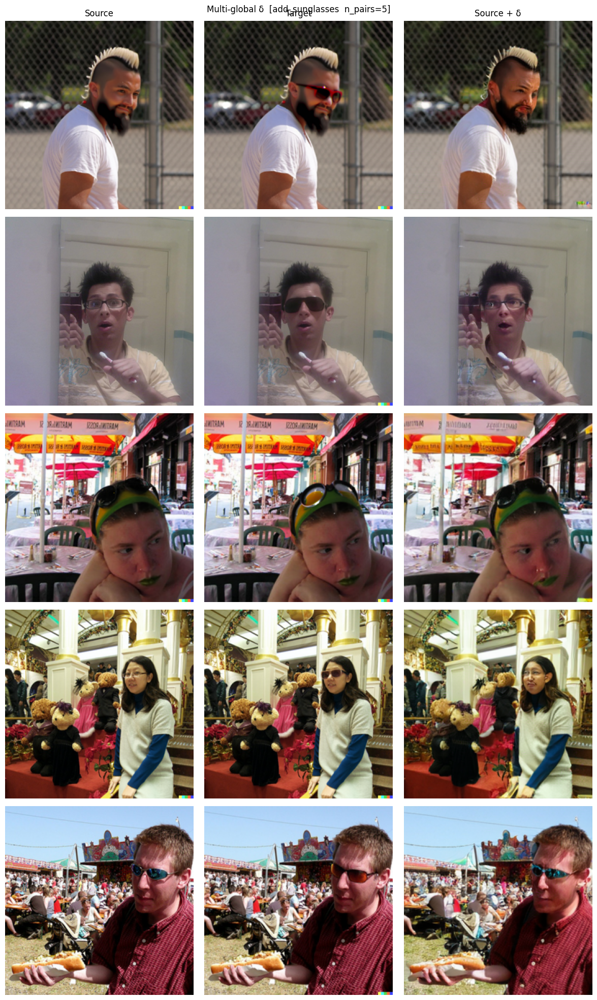

In [10]:
MULTI_GLOBAL_PATH = str(Path(DELTAS_DIR) / EDIT_TYPE / "multi_global.pt")
IMAGE_PATH_MG     = str(_root / "sae/pairs/source.png")   

data_mg      = torch.load(MULTI_GLOBAL_PATH, map_location="cpu")
delta_global = data_mg["delta"].to(device)   # (H,)
print(f"Loaded multi-global delta")
print(f"  shape={tuple(delta_global.shape)}  "
      f"nnz={(delta_global.abs() > 1e-6).sum().item()}  "
      f"n_pairs={data_mg['n_pairs']}  loss={data_mg['final_loss']:.4f}")

@torch.no_grad()
def apply_global(img_tensor, delta, scale=1.0):
    buf = []
    h = unitok.encoder.blocks[15].register_forward_hook(
        lambda m, i, o: buf.append(o.detach().float()))
    unitok.encoder(img_tensor)
    h.remove()
    B, L, D = buf[0].shape
    latent, _, _, _ = sae.encode(buf[0].reshape(B * L, D))

    def _hook(module, inp, out):
        return sae.decode(latent + scale * delta.unsqueeze(0)).reshape(B, L, out.shape[-1]).to(out.dtype)
    handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        tok = unitok.encoder(img_tensor).float()
        tok = unitok.quant_proj(tok)
        tok, _, _, _ = unitok.quantizer(tok)
        tok = unitok.post_quant_proj(tok)
        rec = unitok.decoder(tok).clamp(-1, 1)
    finally:
        handle.remove()
    return denorm(rec)

from datasets import load_dataset
ds_mg = load_dataset("osunlp/MagicBrush", split="train")
instr_to_idx_mg = {instr: i for i, instr in enumerate(ds_mg["instruction"])}

tf_mg = make_transform()
N_PAIRS = data_mg["n_pairs"]

fig, axes = plt.subplots(N_PAIRS, 3, figsize=(12, 4 * N_PAIRS))
fig.suptitle(f"Multi-global δ  [{EDIT_TYPE}  n_pairs={N_PAIRS}]", fontsize=12)
for col, title in enumerate(["Source", "Target", "Source + δ"]):
    axes[0, col].set_title(title)

for i, instr in enumerate(data_mg["instructions"]):
    ds_idx  = instr_to_idx_mg.get(instr)
    sample  = ds_mg[ds_idx]
    src_pil = sample["source_img"].convert("RGB")
    tgt_pil = sample["target_img"].convert("RGB")
    t_src   = tf_mg(src_pil).unsqueeze(0).to(device)
    result  = apply_global(t_src, delta_global, scale=1.0)

    axes[i, 0].imshow(src_pil.resize((256, 256)))
    axes[i, 1].imshow(tgt_pil.resize((256, 256)))
    axes[i, 2].imshow(to_np(result[0]))
    axes[i, 0].set_ylabel(instr[:45], fontsize=7)
    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()

## Initial visualization

10 pairs available
Indexing MagicBrush instructions...


Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/34 [00:00<?, ?it/s]

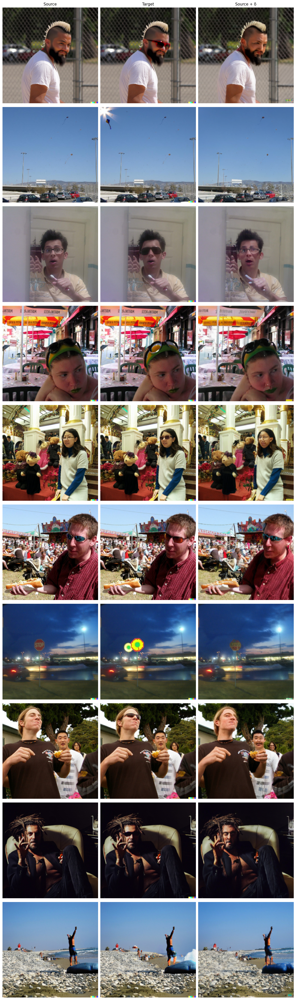

In [54]:
from datasets import load_dataset
from torchvision import transforms as T

def _transform(img_size=256):
    return T.Compose([
        T.Resize((img_size, img_size)),
        T.ToTensor(),
        T.Lambda(lambda x: x * 2 - 1),
    ])

def _denorm(x):
    return ((x + 1) / 2).clamp(0, 1)

def _to_np(t):
    return (t.cpu().clamp(0, 1).permute(1, 2, 0).numpy() * 255).astype(np.uint8)

@torch.no_grad()
def _apply_delta(imgs, delta):
    def _hook(module, inp, out):
        B, Lh, D = out.shape
        latent, _, _, _ = sae.encode(out.float().reshape(B * Lh, D))
        d = delta.unsqueeze(0).expand(B, -1, -1).reshape(B * Lh, sae.hidden_dim)
        return sae.decode(latent + d).reshape(B, Lh, D).to(out.dtype)
    handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        img_tokens = unitok.encoder(imgs).float()
        img_tokens = unitok.quant_proj(img_tokens)
        img_tokens, _, _, _ = unitok.quantizer(img_tokens)
        img_tokens = unitok.post_quant_proj(img_tokens)
        img_rec    = unitok.decoder(img_tokens).clamp(-1, 1)
    finally:
        handle.remove()
    return _denorm(img_rec)

individual_dir = Path(DELTAS_DIR) / EDIT_TYPE
pair_files     = sorted(individual_dir.glob("*.pt"))
pair_data      = [torch.load(f, map_location="cpu") for f in pair_files]
print(f"{len(pair_data)} pairs available")

print("Indexing MagicBrush instructions...")
ds_vis       = load_dataset("osunlp/MagicBrush", split="train")
instr_to_idx = {instr: i for i, instr in enumerate(ds_vis["instruction"])}

tf    = _transform()
N_SHOW = min(10, len(pair_data))

fig, axes = plt.subplots(N_SHOW, 3, figsize=(12, 4 * N_SHOW))
if N_SHOW == 1:
    axes = axes[np.newaxis, :]
for col, title in enumerate(["Source", "Target", "Source + δ"]):
    axes[0, col].set_title(title, fontsize=11)

for i, pd_item in enumerate(pair_data[:N_SHOW]):
    instr    = pd_item["instruction"]
    delta_i  = pd_item["delta"].to(device)
    loss_val = pd_item.get("final_loss", float("nan"))

    ds_idx = instr_to_idx.get(instr)
    if ds_idx is None:
        print(f"  [{i}] instruction not found in dataset, skipping")
        continue
    sample  = ds_vis[ds_idx]
    src_pil = sample["source_img"].convert("RGB")
    tgt_pil = sample["target_img"].convert("RGB")

    t_src  = tf(src_pil).unsqueeze(0).to(device)
    result = _apply_delta(t_src, delta_i)

    axes[i, 0].imshow(src_pil.resize((256, 256)))
    axes[i, 1].imshow(tgt_pil.resize((256, 256)))
    axes[i, 2].imshow(_to_np(result[0]))
    axes[i, 0].set_ylabel(f"loss={loss_val:.3f}\n{instr[:45]}", fontsize=7)
    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/{EDIT_TYPE}_pairs.png", dpi=150)
plt.show()

In [8]:
stacked_path   = Path(DELTAS_DIR) / f"{EDIT_TYPE}.pt"
individual_dir = Path(DELTAS_DIR) / EDIT_TYPE

if stacked_path.exists():
    data         = torch.load(stacked_path, map_location="cpu")
    deltas       = data["deltas"]
    instructions = data.get("instructions", [])
elif individual_dir.exists():
    files        = sorted(individual_dir.glob("*.pt"))
    loaded       = [torch.load(f, map_location="cpu") for f in files]
    deltas       = torch.stack([d["delta"] for d in loaded])
    instructions = [d["instruction"] for d in loaded]
else:
    raise FileNotFoundError(
        f"No deltas found for '{EDIT_TYPE}'. Run run_magicbrush.py first."
    )

N, L, H = deltas.shape
grid = int(L ** 0.5)   # 8 if L=64 (32px patches), 16 if L=256 (16px patches)
print(f"Loaded {N} deltas  shape={tuple(deltas.shape)}  patch_grid={grid}x{grid}")
print(f"\nInstructions:")
for i, instr in enumerate(instructions):
    print(f"  [{i:2d}] {instr}")


Instructions:


NameError: name 'instructions' is not defined

## trying on a single pair

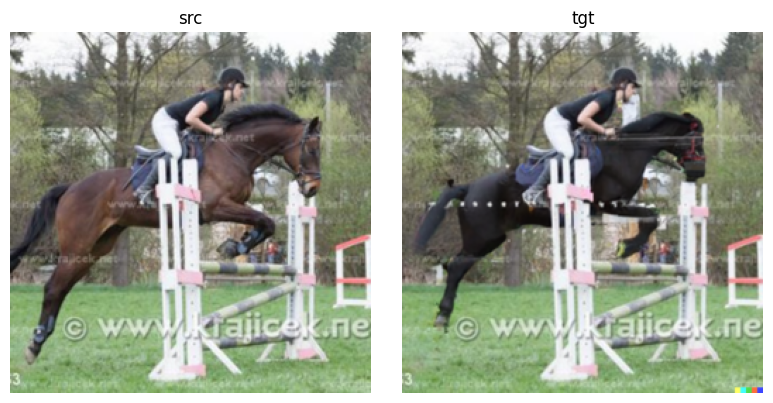

In [6]:
from PIL import Image
src = Image.open("/scratch/work/vuh12/UniTok/sae/pairs/source_img.png")
tgt = Image.open("/scratch/work/vuh12/UniTok/sae/pairs/target_img.png")
transform = _transform()

pil_src = src.convert("RGB").resize((256, 256))
pil_tgt = tgt.convert("RGB").resize((256, 256))

tensor_src = transform(pil_src).unsqueeze(0).to(device)
tensor_target = transform(pil_tgt).unsqueeze(0).to(device)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(pil_src.resize((256, 256))); axes[0].set_title("src"); axes[0].axis("off")
axes[1].imshow(pil_tgt.resize((256, 256))); axes[1].set_title("tgt"); axes[1].axis("off")
plt.tight_layout(); plt.show()

In [ ]:
# run before the next cell
dense_data = torch.load("sae/dense_features.pt", map_location="cpu")
dense_feature_ids = dense_data["dense_features"]
dense_mask = torch.zeros(sae.hidden_dim, dtype=torch.bool)
dense_mask[dense_feature_ids] = True
dense_mask = dense_mask.to(device)

In [48]:
def find_delta_patchwise_prevq(tensor_src, tensor_target, lr=10.0, n_steps=5000, verbose=True, dense_mask=None):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_target).float()).detach()

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    try:
        with torch.no_grad():
            unitok.encoder(tensor_src)
            src_acts = act_buffer[0]
    finally:
        handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(L, sae.hidden_dim, device=device, requires_grad=True)  # (256, 8192)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2000, factor=0.5, min_lr=lr * 0.001)
    loss_steps = []
    lr_steps = []

    for step in range(n_steps):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        try:
            src_tokens = unitok.quant_proj(unitok.encoder(tensor_src).float())
        finally:
            handle.remove()

        loss = F.mse_loss(src_tokens, tgt_tokens)
        loss.backward()
        optimizer.step()
        if dense_mask is not None:
            with torch.no_grad():
                delta[:, dense_mask] = 0.0
        scheduler.step(loss.item())
        loss_steps.append(loss.item())
        lr_steps.append(optimizer.param_groups[0]['lr'])
        if verbose and step % 500 == 0:
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                  f"lr={optimizer.param_groups[0]['lr']:.5f}")

    return delta.detach(), src_latent, loss_steps

  step    0  loss=2.959494  lr=50.00000
  step  500  loss=1.557727  lr=50.00000
  step 1000  loss=1.118462  lr=50.00000
  step 1500  loss=0.864128  lr=50.00000
  step 2000  loss=0.687532  lr=50.00000
  step 2500  loss=0.556438  lr=50.00000
  step 3000  loss=0.455431  lr=50.00000
  step 3500  loss=0.377002  lr=50.00000
  step 4000  loss=0.314422  lr=50.00000
  step 4500  loss=0.263569  lr=50.00000
  step 5000  loss=0.221604  lr=50.00000
  step 5500  loss=0.187208  lr=50.00000
  step 6000  loss=0.159354  lr=50.00000
  step 6500  loss=0.136450  lr=50.00000
  step 7000  loss=0.117461  lr=50.00000
  step 7500  loss=0.101600  lr=50.00000
  step 8000  loss=0.088252  lr=50.00000
  step 8500  loss=0.076943  lr=50.00000
  step 9000  loss=0.067306  lr=50.00000
  step 9500  loss=0.059064  lr=50.00000


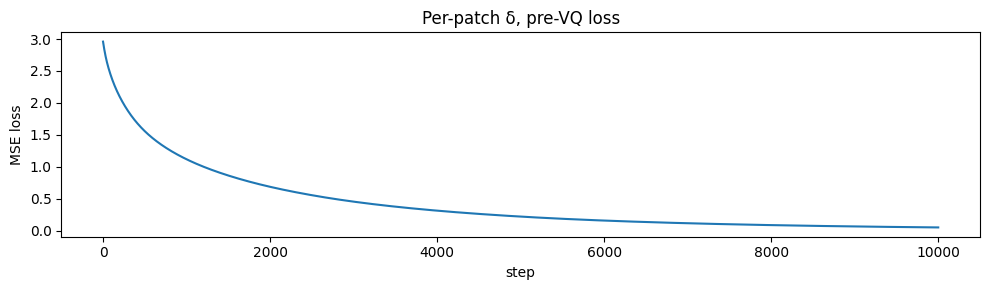

In [49]:
delta_pw, src_latent, loss_curve = find_delta_patchwise_prevq(
    tensor_src, tensor_target, lr=50.0, n_steps=10000, dense_mask=dense_mask,
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Per-patch δ, pre-VQ loss")
plt.tight_layout(); plt.show()

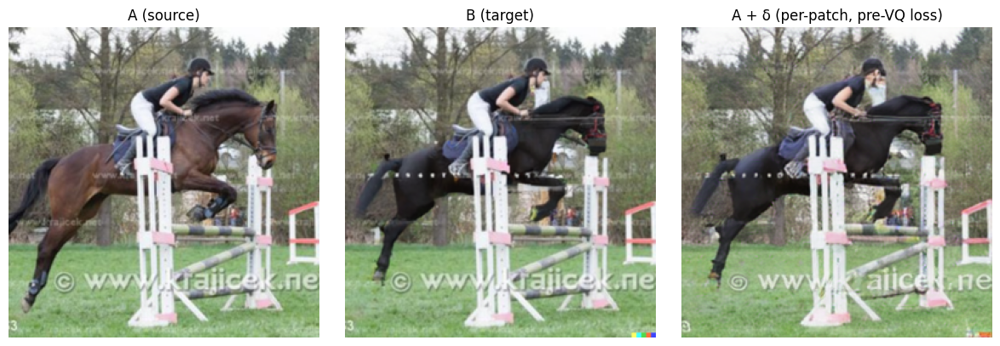

In [50]:
@torch.no_grad()
def delta_patchwise_forward(imgs, delta):
    def _hook(module, inp, out):
        B, L, D = out.shape
        latent, _, _, _ = sae.encode(out.float().reshape(B * L, D))
        latent = latent + delta
        return sae.decode(latent).reshape(B, L, D).to(out.dtype)
    handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        img_tokens = unitok.encoder(imgs).float()
        img_tokens = unitok.quant_proj(img_tokens)
        img_tokens, _, _, _ = unitok.quantizer(img_tokens)
        img_tokens = unitok.post_quant_proj(img_tokens)
        img_rec = unitok.decoder(img_tokens).clamp(-1, 1)
    finally:
        handle.remove()
    return _denorm(img_rec)

result = delta_patchwise_forward(tensor_src, delta_pw)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_src.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_tgt.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(_to_np(result[0]));         axes[2].set_title("A + δ (per-patch, pre-VQ loss)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

In [32]:
@torch.no_grad()
def get_active_features(img_tensor):
    """Returns (L, k) indices of active SAE features per patch."""
    buf = []
    def _hook(m, i, o): buf.append(o.float())
    h = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        unitok.encoder(img_tensor)
    finally:
        h.remove()
    B, L, D = buf[0].shape
    latents, topk_idx, _, _ = sae.encode(buf[0].reshape(B * L, D))
    return topk_idx.reshape(L, sae.k), latents.reshape(L, -1)   # (L, k)

idx_a, latent_a = get_active_features(tensor_src)   # (L, k)
idx_b, latent_b = get_active_features(tensor_target)   # (L, k)

# Global sets collapsed across all patches
set_a = set(idx_a.reshape(-1).tolist())
set_b = set(idx_b.reshape(-1).tolist())

only_a  = set_a - set_b   # fired in A, gone in B
only_b  = set_b - set_a   # newly fire in B
in_both = set_a & set_b

print(f"Active in A only  (lost)  : {len(only_a)}")
print(f"Active in B only  (gained): {len(only_b)}")
print(f"Active in both            : {len(in_both)}")
print(f"\nGained in B: {sorted(only_b)}")
print(f"Lost from A: {sorted(only_a)}")

Active in A only  (lost)  : 435
Active in B only  (gained): 546
Active in both            : 2013

Gained in B: [3, 6, 60, 82, 86, 95, 100, 107, 123, 135, 164, 168, 171, 210, 222, 233, 251, 329, 342, 343, 346, 347, 384, 394, 415, 418, 422, 443, 492, 495, 496, 534, 548, 563, 582, 584, 596, 623, 634, 649, 657, 666, 672, 673, 706, 739, 777, 778, 798, 800, 804, 822, 828, 838, 856, 859, 865, 871, 879, 883, 890, 905, 926, 950, 963, 972, 1017, 1062, 1079, 1094, 1096, 1111, 1115, 1140, 1146, 1150, 1209, 1212, 1223, 1226, 1256, 1311, 1330, 1335, 1353, 1473, 1477, 1481, 1488, 1500, 1509, 1534, 1571, 1585, 1587, 1612, 1623, 1654, 1660, 1667, 1673, 1679, 1680, 1687, 1704, 1712, 1715, 1720, 1724, 1739, 1749, 1756, 1772, 1775, 1780, 1803, 1806, 1815, 1819, 1847, 1864, 1903, 1921, 1938, 1954, 1972, 1990, 2009, 2012, 2014, 2016, 2037, 2041, 2049, 2057, 2083, 2099, 2102, 2107, 2112, 2113, 2115, 2131, 2134, 2149, 2152, 2168, 2178, 2186, 2191, 2199, 2210, 2216, 2219, 2231, 2249, 2267, 2269, 2271, 2276, 22

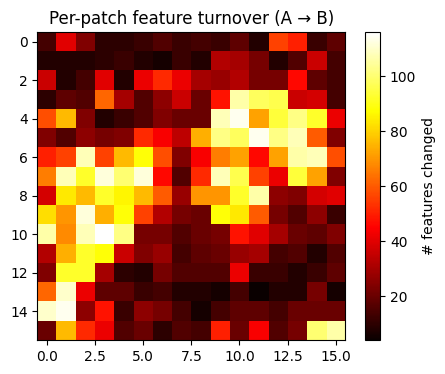

In [25]:
# Per-patch view: how many features changed at each patch location
changed_per_patch = torch.zeros(L)
for p in range(L):
    pa = set(idx_a[p].tolist())
    pb = set(idx_b[p].tolist())
    changed_per_patch[p] = len(pa ^ pb)

plt.figure(figsize=(5, 4))
plt.imshow(changed_per_patch.reshape(grid, grid).numpy(), cmap="hot")
plt.colorbar(label="# features changed")
plt.title("Per-patch feature turnover (A → B)")
plt.show()

In [26]:
@torch.no_grad()
def reconstruct_from_latent(img_tensor, modified_latent):
    def _hook(m, i, o): 
        B, Lh, D = o.shape
        return sae.decode(modified_latent).reshape(B, Lh, D).to(o.dtype)
    h = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        tokens = unitok.encoder(img_tensor).float()
        tokens = unitok.quant_proj(tokens)
        tokens, _, _, _ = unitok.quantizer(tokens)
        tokens = unitok.post_quant_proj(tokens)
        rec = unitok.decoder(tokens).clamp(-1,1)
    finally:
        h.remove()
    return ((rec + 1)/2).clamp(0,1)

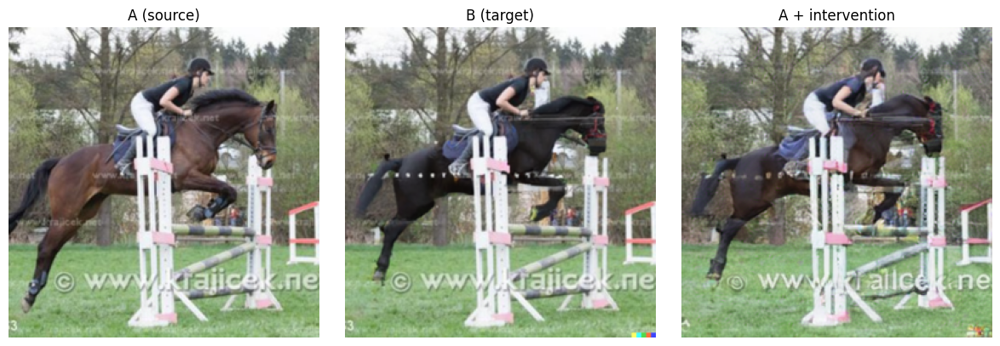

In [27]:
modified = latent_a.clone()
for p in range(L):
    pa = set(idx_a[p].tolist())
    pb = set(idx_b[p].tolist())
    only_a_p = list(pa - pb)
    only_b_p = list(pb - pa)
    if only_a_p:
        modified[p, only_a_p] = 0.0
    if only_b_p:
        modified[p, only_b_p] = latent_b[p, only_b_p]

result = reconstruct_from_latent(tensor_src, modified)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_src.resize((256, 256)));  axes[0].set_title("A (source)");      axes[0].axis("off")
axes[1].imshow(pil_tgt.resize((256, 256)));  axes[1].set_title("B (target)");      axes[1].axis("off")
axes[2].imshow(_to_np(result[0]));            axes[2].set_title("A + intervention"); axes[2].axis("off")
plt.tight_layout()
plt.show()

In [46]:
DENSE_PATH = str(_root / "sae/dense_features.pt")

dense_data = torch.load(DENSE_PATH, map_location="cpu")
dense_feature_ids = dense_data["dense_features"]
dense_mask = torch.zeros(sae.hidden_dim, dtype=torch.bool)
dense_mask[dense_feature_ids] = True
dense_mask = dense_mask.to(device)
# print(f"Dense features: {dense_mask.sum().item()} / {sae.hidden_dim} ")

@torch.no_grad()
def _get_latents(img_tensor):
    buf = []
    h = unitok.encoder.blocks[15].register_forward_hook(
        lambda m,i,o: buf.append(o.detach().float()))
    unitok.encoder(img_tensor)
    h.remove()
    B, L, D = buf[0].shape
    latent, topk_idx, _, _ = sae.encode(buf[0].reshape(B * L, D))
    return latent, topk_idx, B, L

@torch.no_grad()
def _decode_latent(img_tensor, latent, B, L):
    def _hook(module, inp, out):
        return sae.decode(latent).reshape(B, L, out.shape[-1]).to(out.dtype)
    handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        tok = unitok.encoder(img_tensor).float()
        tok = unitok.quant_proj(tok)
        tok, _, _, _ = unitok.quantizer(tok)
        tok = unitok.post_quant_proj(tok)
        rec = unitok.decoder(tok).clamp(-1, 1)
    finally:
        handle.remove()
    return _denorm(rec)

latent, topk_idx, B, L = _get_latents(tensor_target)
active_ids    = topk_idx.reshape(-1).unique()
dense_active_ids = active_ids[dense_mask[active_ids]]
print(f"Unique active SAE features in this image : {len(active_ids)}")
print(f"  -> dense (always-fire) among them       : {len(dense_active_ids)}  "
      f"({n_dense_active / max(len(active_ids), 1) * 100:.1f}%)")

Unique active SAE features in this image : 2559
  -> dense (always-fire) among them       : 45  (1.8%)


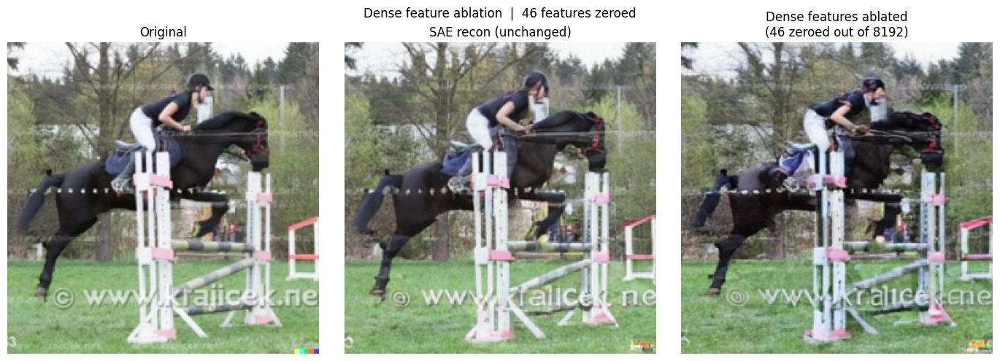

In [47]:
latent_ablated = latent.clone()
latent_ablated[:, dense_active_ids] = 0.0

rec_baseline = _decode_latent(tensor_target, latent.clone(), B, L)   # SAE recon, no change
rec_ablated  = _decode_latent(tensor_target, latent_ablated,  B, L)  # dense features zeroed

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
fig.suptitle(f"Dense feature ablation  |  {n_dense_active} features zeroed", fontsize=12)
axes[0].imshow(pil_tgt.resize((256, 256)))
axes[0].set_title("Original")
axes[1].imshow(_to_np(rec_baseline[0]))
axes[1].set_title("SAE recon (unchanged)")
axes[2].imshow(_to_np(rec_ablated[0]))
axes[2].set_title(f"Dense features ablated\n({n_dense_active} zeroed out of {sae.hidden_dim})")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

## Analysis

Top 20 features for 'add_sun':
  [ 1] feature  6812  score=14.8761  active_in=100% of pairs
  [ 2] feature  6456  score=14.7872  active_in=100% of pairs
  [ 3] feature  3133  score=13.2342  active_in=100% of pairs
  [ 4] feature  4130  score=13.1739  active_in=100% of pairs
  [ 5] feature  4437  score=12.5829  active_in=100% of pairs
  [ 6] feature  7682  score=12.4932  active_in=100% of pairs
  [ 7] feature  7093  score=12.4193  active_in=100% of pairs
  [ 8] feature  3681  score=11.6664  active_in=100% of pairs
  [ 9] feature  3264  score=11.5625  active_in=100% of pairs
  [10] feature  7734  score=11.5582  active_in=100% of pairs
  [11] feature  6976  score=11.5132  active_in=100% of pairs
  [12] feature  4918  score=11.4081  active_in=100% of pairs
  [13] feature  8056  score=11.3798  active_in=100% of pairs
  [14] feature  2953  score=11.3207  active_in=100% of pairs
  [15] feature  6876  score=11.1445  active_in=100% of pairs
  [16] feature  4579  score=11.0752  active_in=100% of

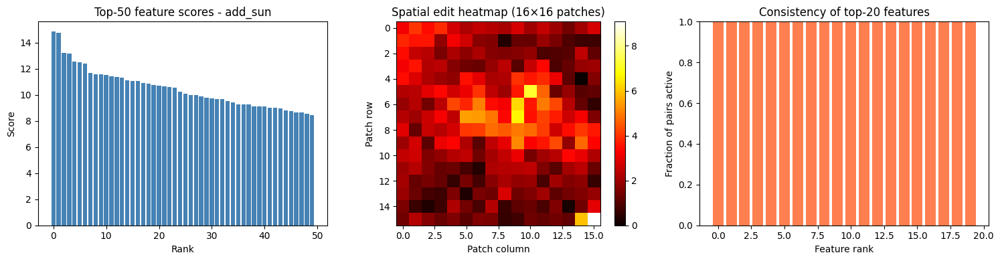

In [27]:
feat_score      = deltas.abs().max(dim=1).values.mean(dim=0)       
spatial_heatmap = deltas.abs().max(dim=2).values.mean(dim=0).reshape(grid, grid)  

# Consistency: fraction of pairs where each feature is active
active_mask = deltas.abs().max(dim=1).values > 1e-2   # (N, 8192)
consistency = active_mask.float().mean(0)              # (8192,)

top_k  = 20
top    = feat_score.topk(top_k)
print(f"Top {top_k} features for '{EDIT_TYPE}':")
for rank, (idx, val) in enumerate(zip(top.indices.tolist(), top.values.tolist())):
    consist = consistency[idx].item()
    print(f"  [{rank+1:2d}] feature {idx:5d}  score={val:.4f}  active_in={consist*100:.0f}% of pairs")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].bar(range(50), feat_score.topk(50).values.numpy(), color="steelblue")
axes[0].set_xlabel("Rank")
axes[0].set_ylabel("Score")
axes[0].set_title(f"Top-50 feature scores - {EDIT_TYPE}")

im = axes[1].imshow(spatial_heatmap.numpy(), cmap="hot", interpolation="nearest")
axes[1].set_title("Spatial edit heatmap (16×16 patches)")
axes[1].set_xlabel("Patch column")
axes[1].set_ylabel("Patch row")
plt.colorbar(im, ax=axes[1])

axes[2].bar(range(top_k), consistency[top.indices].numpy(), color="coral")
axes[2].set_xlabel("Feature rank")
axes[2].set_ylabel("Fraction of pairs active")
axes[2].set_title(f"Consistency of top-{top_k} features")
axes[2].set_ylim(0, 1)

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/{EDIT_TYPE}_overview.png", dpi=150)
plt.show()

In [26]:
threshold       = 1.0
active_per_pair = deltas.abs().max(dim=1).values > threshold   # (N, 8192)
common_mask     = active_per_pair.all(dim=0)                   # (8192,)
common_features = common_mask.nonzero().squeeze(1)             # (M,)

print(f"Threshold: {threshold}")
print(f"Features active in ALL {N} pairs: {len(common_features)}")

if len(common_features) > 0:
    scores_common = feat_score[common_features]
    ranked_common = common_features[scores_common.argsort(descending=True)]
    print(f"\nTop 15 common features (by score):")
    for i, fid in enumerate(ranked_common[:15].tolist()):
        print(f"  [{i+1:2d}] feature {fid:5d}  score={feat_score[fid]:.4f}")
else:
    print("No features active in every pair — checking 80% threshold...")
    pct_80_mask  = active_per_pair.float().mean(0) >= 0.8
    pct_80_feats = pct_80_mask.nonzero().squeeze(1)
    print(f"  Active in ≥80% of pairs: {len(pct_80_feats)} features")
    if len(pct_80_feats) > 0:
        sc = feat_score[pct_80_feats]
        ranked_80 = pct_80_feats[sc.argsort(descending=True)]
        print(f"  Top 10: {ranked_80[:10].tolist()}")

Threshold: 1.0
Features active in ALL 10 pairs: 203

Top 15 common features (by score):
  [ 1] feature  6812  score=14.8761
  [ 2] feature  6456  score=14.7872
  [ 3] feature  3133  score=13.2342
  [ 4] feature  4130  score=13.1739
  [ 5] feature  4437  score=12.5829
  [ 6] feature  7682  score=12.4932
  [ 7] feature  7093  score=12.4193
  [ 8] feature  3681  score=11.6664
  [ 9] feature  3264  score=11.5625
  [10] feature  7734  score=11.5582
  [11] feature  6976  score=11.5132
  [12] feature  4918  score=11.4081
  [13] feature  8056  score=11.3798
  [14] feature  2953  score=11.3207
  [15] feature  6876  score=11.1445
